<a href="https://colab.research.google.com/github/ahmed98Osama/Head_Pose_Estimation/blob/main/Head_Pose_Estimation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Head Pose Estimation**

- In this project we will draw the 3 position axis (pitch,yaw,roll) by predicting the 3 angels of each position by training 3 models to predict each angel. 
- We will use [AFLW2000](http://www.cbsr.ia.ac.cn/users/xiangyuzhu/projects/3DDFA/Database/AFLW2000-3D.zip) dataset with contains 2000 image and 2000 matlab file with contains the 3 labels (angels).
- We will use MediaPipe library in both training and testing phases:
  - In Training: first we dtect the face of each image then using the same library to generate the landmark points of the face after this phase the training data (features) will contain 1853 samples with 936 columns (468 for X and 468 for Y), for labels we will extract the 3 angels from the mat file. 
  - In Testing: we will use the MediaPipe Library to generate the landmarks as we did in the training phase and using the trained models to predict the 3 labels and using them to draw the axis.  

### Installing MediaPipe and pycaret

In [1]:
%%capture
!pip install mediapipe

In [ ]:
#need to restart runtime (kernal) after install 
!pip install --pre pycaret
#restart
!cls
import os
os.kill(os.getpid(), 9)


In [1]:
from IPython.display import display
from pycaret.utils import version
# To render interactive plots in Google Colab
from pycaret.utils import enable_colab
enable_colab()
from pycaret.regression import *
# PyCaret version
version()

'3.0.0.rc2'

### Importing Libraries

In [2]:
import numpy as np
import os
import cv2
import math
import glob
import random
import scipy.io as sio
from math import cos, sin
from pathlib import Path
import pandas as pd
import mediapipe
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import cross_val_score, GridSearchCV
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_absolute_error
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
from sklearn.svm import SVR


from pandas import plotting
from sklearn.metrics import confusion_matrix

import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('fivethirtyeight')
from sklearn.metrics import ConfusionMatrixDisplay
from mlxtend.plotting import plot_confusion_matrix
import matplotlib.pyplot as plt
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.preprocessing import LabelEncoder
from imblearn.over_sampling import SMOTE, ADASYN, BorderlineSMOTE, KMeansSMOTE, SVMSMOTE
from sklearn.mixture import GaussianMixture
from sklearn.ensemble import RandomForestClassifier, VotingClassifier


### Loading Data

In [3]:
# link of the data
# http://www.cbsr.ia.ac.cn/users/xiangyuzhu/projects/3DDFA/Database/AFLW2000-3D.zip

# Loading AFLW2000 Data
%%capture
if os.path.isfile('/content/AFLW2000-3D.zip') == False:
  !gdown --id  1fP3zvSCYjll_o_m7S12nvQLZ9MnsEoap
  !unzip /content/AFLW2000-3D.zip

### Preparing Data for Training

In [4]:
# X_points, Y_points, labels and detected files which are the images thar MediaPipe was able to detect the face  
X_points = []
Y_points = []
labels = []
detected_files = []

# extracting the file names (2000 name)
file_names = sorted([Path(f).stem for f in glob.glob("/content/AFLW2000/*.mat")])

# detecting faces and extracting the points
faceModule = mediapipe.solutions.face_mesh
# looping over the file names to load the images and their corresponding mat file
for filename in file_names:
  with faceModule.FaceMesh(static_image_mode=True) as faces:
    # loading the image
    image = cv2.imread('/content/AFLW2000/'+filename+'.jpg')
    # processing the image to detect the face and then generating the land marks (468 for each x,y,z).
    results = faces.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    if results.multi_face_landmarks != None: 
          # appending the file names where have been detected.
          detected_files.append(filename)
          # detecting the face
          face = results.multi_face_landmarks[0]
          # initializing two lists to store the points for the image.
          X = []
          Y = []
          # looping over the 468 points of x and y
          for landmark in face.landmark:
              x = landmark.x
              y = landmark.y
              # note: the x and y values are scaled to the their width and height so we will get back their actual value in the image.
              shape = image.shape 
              relative_x = int(x * shape[1])
              relative_y = int(y * shape[0])
              # X_features
              X.append(relative_x)
              # Y_features
              Y.append(relative_y)

          # converting the lists to numpy arrays
          X = np.array(X)
          Y = np.array(Y)
          # appending the points of the images in the list of all image points
          X_points.append(X)
          Y_points.append(Y)

          # loading the mat file to extract the labels (pitch,yaw,roll)
          mat_file = sio.loadmat('/content/AFLW2000/'+filename+'.mat')
          # extracting the labels 3 angels
          pose_para = mat_file["Pose_Para"][0][:3]
          # appending the 3 angels to labels list
          labels.append(pose_para)

# converting features and labels to 2D array
X_points = np.array(X_points)
Y_points = np.array(Y_points)
labels = np.array(labels)

# the first label (pitch)
pitch_label = labels[:,0]
# the second label (yaw)
yaw_label = labels[:,1]
# the third label (roll)
roll_label = labels[:,2]
print(X_points.shape)
print(Y_points.shape)
print(labels.shape)

(1853, 468)
(1853, 468)
(1853, 3)


### Defining function for drawing the 3 axis

In [5]:
def draw_axis(img, pitch,yaw,roll, tdx=None, tdy=None, size = 100):

    yaw = -yaw
    if tdx != None and tdy != None:
        tdx = tdx
        tdy = tdy
    else:
        height, width = img.shape[:2]
        tdx = width / 2
        tdy = height / 2

    # X-Axis pointing to right. drawn in red
    x1 = size * (cos(yaw) * cos(roll)) + tdx
    y1 = size * (cos(pitch) * sin(roll) + cos(roll) * sin(pitch) * sin(yaw)) + tdy

    # Y-Axis | drawn in green
    #        v
    x2 = size * (-cos(yaw) * sin(roll)) + tdx
    y2 = size * (cos(pitch) * cos(roll) - sin(pitch) * sin(yaw) * sin(roll)) + tdy

    # Z-Axis (out of the screen) drawn in blue
    x3 = size * (sin(yaw)) + tdx
    y3 = size * (-cos(yaw) * sin(pitch)) + tdy

    cv2.line(img, (int(tdx), int(tdy)), (int(x1),int(y1)),(0,0,255),3)
    cv2.line(img, (int(tdx), int(tdy)), (int(x2),int(y2)),(0,255,0),3)
    cv2.line(img, (int(tdx), int(tdy)), (int(x3),int(y3)),(255,0,0),2)

    return img

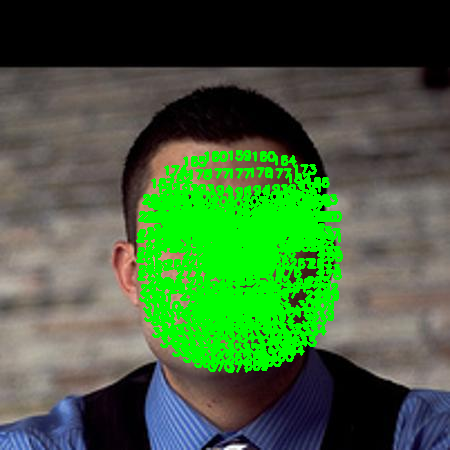

468
468


In [6]:
faceModule = mediapipe.solutions.face_mesh
# loading image and its correspinding mat file
with faceModule.FaceMesh(static_image_mode=True) as faces:
    # loading the image
    image = cv2.imread('/content/AFLW2000/image00019.jpg')
    # processing the face to extract the landmark points (468 point) for each x,y,z
    results = faces.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    if results.multi_face_landmarks != None: 
      # looping over the faces in the image
      x_list = []
      y_list = []
      for face in results.multi_face_landmarks:
          for landmark in face.landmark:
              x = landmark.x
              y = landmark.y
              # note: the x and y values are scaled to the their width and height so we will get back their actual value in the image
              shape = image.shape 
              relative_x = int(x * shape[1])
              relative_y = int(y * shape[0])
              cv2.putText(image, str(relative_y), (int(relative_x),int(relative_y)), cv2.FONT_HERSHEY_SIMPLEX, 0.4, (0,255,0), 2)
              #cv2.circle(image, (relative_x, relative_y), radius=1, color=(100, 25, 0), thickness=2)
              x_list.append(relative_x)
              y_list.append(relative_y)
      
      cv2_imshow(image)
      print(len(x_list))
      print(len(y_list))


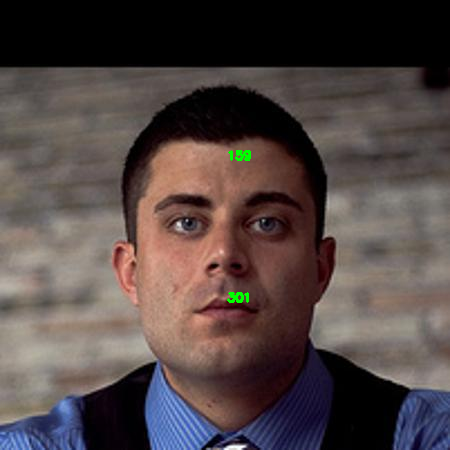

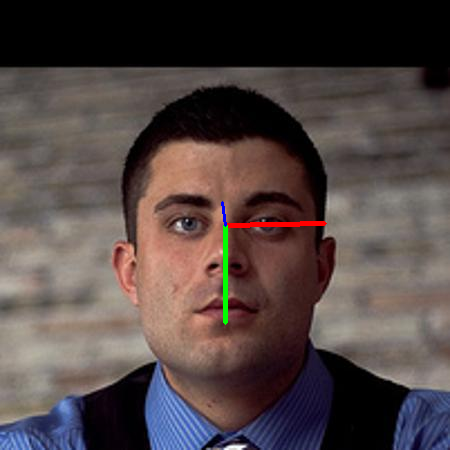

In [7]:
image = cv2.imread('/content/AFLW2000/image00019.jpg')
for i in range (10, 12):
  cv2.putText(image, str(y_list[i]), (int(x_list[i]),int(y_list[i])), cv2.FONT_HERSHEY_SIMPLEX, 0.4, (0,255,0), 2)
cv2_imshow(image)
image = cv2.imread('/content/AFLW2000/image00019.jpg')
# loading the mat file to extract the 3 angels of the face (pitch,yaw,roll)
mat_file = sio.loadmat('/content/AFLW2000/image00019.mat')
# extracting the labels 3 angels
pose_para = mat_file["Pose_Para"][0][:3]
pitch = pose_para[0]
yaw = pose_para[1]
roll = pose_para[2]
cv2_imshow(draw_axis(image,pitch,yaw,roll))

In [8]:
file_names = sorted([Path(f).stem for f in glob.glob('/content/AFLW2000/*.mat')])

faceModule = mediapipe.solutions.face_mesh
X_x = []
X_y = []
# labels
pitch = []
yaw = []
roll = []

for file_name in file_names:
    with faceModule.FaceMesh(static_image_mode=True) as faces:
      
        # loading the image and the mat file
        image = cv2.imread('/content/AFLW2000/'+file_name+'.jpg')

        # processing the face to extract the landmark points (468 point) for each x,y,z
        results = faces.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        if results.multi_face_landmarks != None: 
          mat_file = sio.loadmat('/content/AFLW2000/'+file_name+'.mat')
          # looping over the faces in the image
          face =  results.multi_face_landmarks[0]
          x_list = []
          y_list = []
          for landmark in face.landmark:
              x = landmark.x
              y = landmark.y
              # note: the x and y values are scaled to the their width and height so we will get back their actual value in the image
              shape = image.shape 
              relative_x = int(x * shape[1])
              relative_y = int(y * shape[0])
              # cv2.putText(image, str(relative_y), (int(relative_x),int(relative_y)), cv2.FONT_HERSHEY_SIMPLEX, 0.4, (0,255,0), 2)
              #cv2.circle(image, (relative_x, relative_y), radius=1, color=(0, 255, 0), thickness=2)
              x_list.append(relative_x)
              y_list.append(relative_y)
          
          # features
          X_x.append(x_list)
          X_y.append(y_list)

          # labels
          pose_para = mat_file["Pose_Para"][0][:3]
          pitch.append(pose_para[0])
          yaw.append(pose_para[1])
          roll.append(pose_para[2])
        
        #cv2_imshow(image)
    

In [9]:
print(len(X_x))
print(len(X_y))
print(len(pitch))
print(len(yaw))
print(len(roll))

1853
1853
1853
1853
1853


In [10]:
# center = 114
# max =  10 
# min = 171
# centering the data arround the 114th point 
Center_X = X_points - X_points[:,114].reshape(-1,1)
Center_Y = Y_points - Y_points[:,114].reshape(-1,1)

# normalizing the data to be in the same scale by dividing over the distance between point 10 and point 171
X_171 = X_points[:,171]
X_10 = X_points[:,10]
Y_171 = Y_points[:,171]
Y_10 = Y_points[:,10]
# computing the distance
distance = np.linalg.norm(np.array((X_10,Y_10)) - np.array((X_171,Y_171)),axis = 0).reshape(-1,1)
Norm_X = Center_X / distance
Norm_Y = Center_Y / distance

# if you want to choose specific columns from the data
Final_X = Norm_X
Final_Y = Norm_Y

print(Final_X.shape)
print(Final_Y.shape)

# concatinating the X and Y points to form the compelete features
features = np.hstack([Final_X,Final_Y])
print(features.shape)

(1853, 468)
(1853, 468)
(1853, 936)


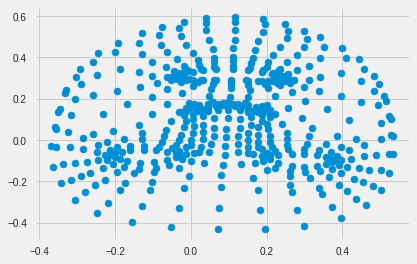

In [11]:
plt.scatter(Norm_X[19], Norm_Y[19])

In [12]:
Xs = pd.DataFrame(Norm_X)
Ys = pd.DataFrame(Norm_Y)
X = pd.concat([Xs, Ys], axis=1)
X.columns = [i for i in range(936)]
X

,0,1,2,3,4,5,6,7,8,9,...,926,927,928,929,930,931,932,933,934,935
0,0.055606,0.064161,0.064161,0.042774,0.064161,0.072715,0.089825,-0.179650,0.098380,0.102657,...,0.230978,0.218146,0.222423,0.235256,0.239533,-0.068438,-0.055606,-0.038496,-0.094102,-0.111212
1,-0.064382,-0.135203,-0.045068,-0.077259,-0.135203,-0.103012,0.000000,0.000000,0.032191,0.025753,...,0.193147,0.186709,0.225338,0.199585,0.212462,-0.070821,-0.057944,-0.051506,-0.090135,-0.109450
2,0.111960,0.122138,0.111960,0.071247,0.122138,0.122138,0.101781,-0.213741,0.091603,0.091603,...,0.183207,0.173029,0.173029,0.193385,0.193385,-0.081425,-0.071247,-0.061069,-0.111960,-0.122138
3,0.157800,0.081445,0.127258,0.020361,0.061084,0.050903,0.040723,-0.167981,0.005090,-0.015271,...,0.188342,0.167981,0.152710,0.198523,0.198523,-0.147619,-0.127258,-0.106897,-0.249426,-0.274878
4,0.131351,0.095116,0.108704,0.045293,0.086057,0.076999,0.058881,-0.176644,0.045293,0.036235,...,0.153998,0.135880,0.153998,0.158527,0.167586,-0.104175,-0.090587,-0.081528,-0.163056,-0.172115
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1848,0.099928,0.137995,0.109444,0.095169,0.142754,0.137995,0.114203,-0.228406,0.109444,0.114203,...,0.195097,0.180821,0.195097,0.199855,0.204613,-0.085652,-0.071377,-0.061860,-0.123720,-0.133237
1849,0.084971,0.129692,0.098387,0.089443,0.134164,0.134164,0.111803,-0.205718,0.111803,0.116276,...,0.205718,0.192302,0.201246,0.214663,0.214663,-0.084971,-0.067082,-0.058138,-0.111803,-0.129692
1850,0.020186,0.060558,0.040372,0.060558,0.075698,0.085791,0.111023,-0.156442,0.136256,0.156442,...,0.206907,0.196814,0.227093,0.206907,0.217000,-0.025233,-0.020186,-0.015140,0.000000,-0.015140
1851,0.063210,0.080065,0.071638,0.058996,0.084279,0.088493,0.105349,-0.198057,0.113777,0.117991,...,0.219127,0.210699,0.219127,0.223341,0.227555,-0.067424,-0.054782,-0.042140,-0.084279,-0.096921


In [13]:
# convert the lists into df
Y = {'pitch': pitch, 'yaw': yaw, 'roll': roll}
Y = pd.DataFrame(Y)
Y.head()

,pitch,yaw,roll
0,-0.399231,0.018227,0.085676
1,0.470065,1.189533,0.300959
2,-0.184650,0.881137,-0.236852
3,-0.175379,0.299208,-0.373374
4,-0.026812,0.011965,-0.220662


In [14]:
XYpitch = pd.concat([X, Y['pitch']], axis=1)
XYpitch

,0,1,2,3,4,5,6,7,8,9,...,927,928,929,930,931,932,933,934,935,pitch
0,0.055606,0.064161,0.064161,0.042774,0.064161,0.072715,0.089825,-0.179650,0.098380,0.102657,...,0.218146,0.222423,0.235256,0.239533,-0.068438,-0.055606,-0.038496,-0.094102,-0.111212,-0.399231
1,-0.064382,-0.135203,-0.045068,-0.077259,-0.135203,-0.103012,0.000000,0.000000,0.032191,0.025753,...,0.186709,0.225338,0.199585,0.212462,-0.070821,-0.057944,-0.051506,-0.090135,-0.109450,0.470065
2,0.111960,0.122138,0.111960,0.071247,0.122138,0.122138,0.101781,-0.213741,0.091603,0.091603,...,0.173029,0.173029,0.193385,0.193385,-0.081425,-0.071247,-0.061069,-0.111960,-0.122138,-0.184650
3,0.157800,0.081445,0.127258,0.020361,0.061084,0.050903,0.040723,-0.167981,0.005090,-0.015271,...,0.167981,0.152710,0.198523,0.198523,-0.147619,-0.127258,-0.106897,-0.249426,-0.274878,-0.175379
4,0.131351,0.095116,0.108704,0.045293,0.086057,0.076999,0.058881,-0.176644,0.045293,0.036235,...,0.135880,0.153998,0.158527,0.167586,-0.104175,-0.090587,-0.081528,-0.163056,-0.172115,-0.026812
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1848,0.099928,0.137995,0.109444,0.095169,0.142754,0.137995,0.114203,-0.228406,0.109444,0.114203,...,0.180821,0.195097,0.199855,0.204613,-0.085652,-0.071377,-0.061860,-0.123720,-0.133237,-0.306358
1849,0.084971,0.129692,0.098387,0.089443,0.134164,0.134164,0.111803,-0.205718,0.111803,0.116276,...,0.192302,0.201246,0.214663,0.214663,-0.084971,-0.067082,-0.058138,-0.111803,-0.129692,-0.367547
1850,0.020186,0.060558,0.040372,0.060558,0.075698,0.085791,0.111023,-0.156442,0.136256,0.156442,...,0.196814,0.227093,0.206907,0.217000,-0.025233,-0.020186,-0.015140,0.000000,-0.015140,-0.156035
1851,0.063210,0.080065,0.071638,0.058996,0.084279,0.088493,0.105349,-0.198057,0.113777,0.117991,...,0.210699,0.219127,0.223341,0.227555,-0.067424,-0.054782,-0.042140,-0.084279,-0.096921,-0.197102


In [15]:
XYyaw = pd.concat([X, Y['yaw']], axis=1)
XYyaw

,0,1,2,3,4,5,6,7,8,9,...,927,928,929,930,931,932,933,934,935,yaw
0,0.055606,0.064161,0.064161,0.042774,0.064161,0.072715,0.089825,-0.179650,0.098380,0.102657,...,0.218146,0.222423,0.235256,0.239533,-0.068438,-0.055606,-0.038496,-0.094102,-0.111212,0.018227
1,-0.064382,-0.135203,-0.045068,-0.077259,-0.135203,-0.103012,0.000000,0.000000,0.032191,0.025753,...,0.186709,0.225338,0.199585,0.212462,-0.070821,-0.057944,-0.051506,-0.090135,-0.109450,1.189533
2,0.111960,0.122138,0.111960,0.071247,0.122138,0.122138,0.101781,-0.213741,0.091603,0.091603,...,0.173029,0.173029,0.193385,0.193385,-0.081425,-0.071247,-0.061069,-0.111960,-0.122138,0.881137
3,0.157800,0.081445,0.127258,0.020361,0.061084,0.050903,0.040723,-0.167981,0.005090,-0.015271,...,0.167981,0.152710,0.198523,0.198523,-0.147619,-0.127258,-0.106897,-0.249426,-0.274878,0.299208
4,0.131351,0.095116,0.108704,0.045293,0.086057,0.076999,0.058881,-0.176644,0.045293,0.036235,...,0.135880,0.153998,0.158527,0.167586,-0.104175,-0.090587,-0.081528,-0.163056,-0.172115,0.011965
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1848,0.099928,0.137995,0.109444,0.095169,0.142754,0.137995,0.114203,-0.228406,0.109444,0.114203,...,0.180821,0.195097,0.199855,0.204613,-0.085652,-0.071377,-0.061860,-0.123720,-0.133237,-0.283822
1849,0.084971,0.129692,0.098387,0.089443,0.134164,0.134164,0.111803,-0.205718,0.111803,0.116276,...,0.192302,0.201246,0.214663,0.214663,-0.084971,-0.067082,-0.058138,-0.111803,-0.129692,-0.429723
1850,0.020186,0.060558,0.040372,0.060558,0.075698,0.085791,0.111023,-0.156442,0.136256,0.156442,...,0.196814,0.227093,0.206907,0.217000,-0.025233,-0.020186,-0.015140,0.000000,-0.015140,0.567114
1851,0.063210,0.080065,0.071638,0.058996,0.084279,0.088493,0.105349,-0.198057,0.113777,0.117991,...,0.210699,0.219127,0.223341,0.227555,-0.067424,-0.054782,-0.042140,-0.084279,-0.096921,-0.070430


In [16]:
XYroll = pd.concat([X, Y['roll']], axis=1)
XYroll

,0,1,2,3,4,5,6,7,8,9,...,927,928,929,930,931,932,933,934,935,roll
0,0.055606,0.064161,0.064161,0.042774,0.064161,0.072715,0.089825,-0.179650,0.098380,0.102657,...,0.218146,0.222423,0.235256,0.239533,-0.068438,-0.055606,-0.038496,-0.094102,-0.111212,0.085676
1,-0.064382,-0.135203,-0.045068,-0.077259,-0.135203,-0.103012,0.000000,0.000000,0.032191,0.025753,...,0.186709,0.225338,0.199585,0.212462,-0.070821,-0.057944,-0.051506,-0.090135,-0.109450,0.300959
2,0.111960,0.122138,0.111960,0.071247,0.122138,0.122138,0.101781,-0.213741,0.091603,0.091603,...,0.173029,0.173029,0.193385,0.193385,-0.081425,-0.071247,-0.061069,-0.111960,-0.122138,-0.236852
3,0.157800,0.081445,0.127258,0.020361,0.061084,0.050903,0.040723,-0.167981,0.005090,-0.015271,...,0.167981,0.152710,0.198523,0.198523,-0.147619,-0.127258,-0.106897,-0.249426,-0.274878,-0.373374
4,0.131351,0.095116,0.108704,0.045293,0.086057,0.076999,0.058881,-0.176644,0.045293,0.036235,...,0.135880,0.153998,0.158527,0.167586,-0.104175,-0.090587,-0.081528,-0.163056,-0.172115,-0.220662
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1848,0.099928,0.137995,0.109444,0.095169,0.142754,0.137995,0.114203,-0.228406,0.109444,0.114203,...,0.180821,0.195097,0.199855,0.204613,-0.085652,-0.071377,-0.061860,-0.123720,-0.133237,0.038554
1849,0.084971,0.129692,0.098387,0.089443,0.134164,0.134164,0.111803,-0.205718,0.111803,0.116276,...,0.192302,0.201246,0.214663,0.214663,-0.084971,-0.067082,-0.058138,-0.111803,-0.129692,0.122791
1850,0.020186,0.060558,0.040372,0.060558,0.075698,0.085791,0.111023,-0.156442,0.136256,0.156442,...,0.196814,0.227093,0.206907,0.217000,-0.025233,-0.020186,-0.015140,0.000000,-0.015140,-0.108536
1851,0.063210,0.080065,0.071638,0.058996,0.084279,0.088493,0.105349,-0.198057,0.113777,0.117991,...,0.210699,0.219127,0.223341,0.227555,-0.067424,-0.054782,-0.042140,-0.084279,-0.096921,0.105118


### Train models

#### pitch models

In [17]:
clf0 = setup(
    data=XYpitch, 
    target='pitch',
    #test_data = test,
    #data_split_shuffle = False,
    n_jobs = -1,
    #remove_perfect_collinearity= False,
    #transformation = True,
    use_gpu = True , #True,force
    session_id=42, #123 # 7 
)


,Description,Value
0,Session id,42
1,Target,pitch
2,Target type,Regression
3,Data shape,"(1853, 937)"
4,Train data shape,"(1297, 937)"
5,Test data shape,"(556, 937)"
6,Numeric features,936
7,Preprocess,True
8,Imputation type,simple
9,Numeric imputation,mean


In [18]:
from sklearn.svm import SVR
svr = SVR() 
# compare models
best = compare_models(include = ['huber', 'ridge' ,svr] , sort='MAE', n_select = 5 )

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
2,Support Vector Regression,0.1118,0.3426,0.3849,0.5389,0.1336,1.0897,0.2750
0,Huber Regressor,0.1176,0.3411,0.3902,0.5146,0.1375,1.1616,1.9510
1,Ridge Regression,0.1382,0.3793,0.4120,0.4542,0.1396,2.2241,0.1700


Processing:   0%|          | 0/19 [00:00<?, ?it/s]

In [19]:
print(best[0])

SVR()


In [20]:
svr_pitch = create_model(svr)
huber_pitch = create_model('huber')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.1036,0.0992,0.3150,0.4200,0.1507,2.2021
1,0.0802,0.0138,0.1174,0.7879,0.0856,0.5757
2,0.1030,0.0274,0.1654,0.6633,0.1122,0.8570
3,0.0766,0.0106,0.1031,0.8242,0.0762,0.7524
4,0.0898,0.0157,0.1254,0.7384,0.0904,1.2804
5,0.1053,0.0600,0.2450,0.4648,0.1362,0.6653
6,0.0901,0.0260,0.1611,0.6899,0.1003,1.8477
7,0.2089,1.9266,1.3880,0.0164,0.2546,1.0885
8,0.0734,0.0141,0.1186,0.7764,0.0852,0.7676


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.1108,0.1079,0.3285,0.3689,0.1576,2.3163
1,0.0883,0.0180,0.1341,0.7231,0.0953,0.5019
2,0.1124,0.0307,0.1751,0.6228,0.1193,0.8825
3,0.0846,0.0142,0.1192,0.7652,0.0852,0.7747
4,0.0959,0.0194,0.1394,0.6767,0.0971,1.2889
5,0.1022,0.0483,0.2198,0.5692,0.1302,0.7141
6,0.0975,0.0284,0.1686,0.6604,0.1135,2.2368
7,0.2065,1.9528,1.3974,0.0030,0.2463,1.1403
8,0.0871,0.0189,0.1373,0.7001,0.0989,0.8314


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [21]:
tuned_svr_pitch = tune_model(svr_pitch)
tuned_huber_pitch = tune_model(huber_pitch)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.2566,0.1721,0.4149,-0.0063,0.2071,5.2929
1,0.2283,0.0894,0.2990,-0.3755,0.1652,2.6208
2,0.2691,0.1170,0.3420,-0.4391,0.1876,2.3175
3,0.2845,0.1308,0.3616,-1.1607,0.1823,3.0537
4,0.2314,0.0870,0.2949,-0.4467,0.1730,3.1034
5,0.3081,0.1747,0.4180,-0.5577,0.1961,3.4551
6,0.2635,0.1212,0.3481,-0.4474,0.1870,7.1921
7,0.3526,2.2701,1.5067,-0.1590,0.2451,3.4177
8,0.2637,0.1178,0.3432,-0.8727,0.1885,3.3205


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.1117,0.1083,0.3291,0.3669,0.1570,1.9406
1,0.0884,0.0171,0.1310,0.7361,0.0929,0.5030
2,0.1130,0.0301,0.1736,0.6293,0.1200,0.8705
3,0.0853,0.0140,0.1184,0.7684,0.0858,0.7799
4,0.0975,0.0192,0.1384,0.6813,0.0979,1.3254
5,0.1032,0.0481,0.2193,0.5711,0.1302,0.7298
6,0.0999,0.0283,0.1683,0.6616,0.1130,2.5722
7,0.2078,1.9598,1.3999,-0.0005,0.2444,1.1517
8,0.0874,0.0180,0.1340,0.7146,0.0969,0.9311


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


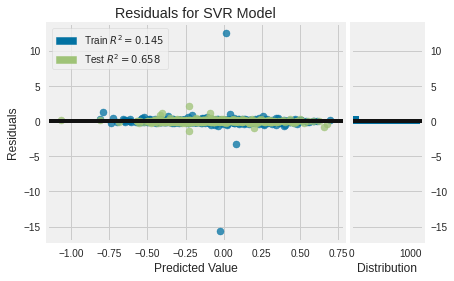

In [22]:
plot_model(tuned_svr_pitch)

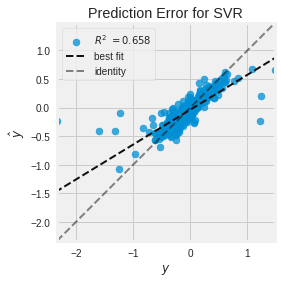

In [23]:
plot_model(tuned_svr_pitch, plot = 'error')

In [24]:
evaluate_model(tuned_svr_pitch)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [25]:
predict_model(tuned_svr_pitch);

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Support Vector Regression,0.0891,0.0320,0.1788,0.6576,0.1063,3.5976


In [26]:
final_svr_pitch = finalize_model(tuned_svr_pitch)

In [27]:
print(final_svr_pitch)


SVR()


In [28]:
predict_model(final_svr_pitch);

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Support Vector Regression,0.0852,0.0297,0.1724,0.6817,0.1015,3.7381


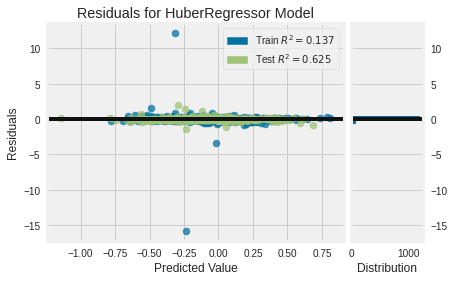

In [29]:
plot_model(tuned_huber_pitch)

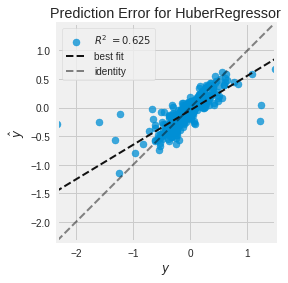

In [30]:
plot_model(tuned_huber_pitch, plot = 'error')

In [31]:
evaluate_model(tuned_huber_pitch)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [32]:
predict_model(tuned_huber_pitch);

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Huber Regressor,0.0961,0.0350,0.1870,0.6253,0.1139,2.9682


In [33]:
final_huber_pitch = finalize_model(tuned_huber_pitch)

In [34]:
predict_model(final_huber_pitch);

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Huber Regressor,0.0943,0.0344,0.1855,0.6314,0.1125,3.1129


In [35]:
blender_pitch = blend_models(estimator_list = [final_huber_pitch, final_svr_pitch])

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.1043,0.1030,0.3209,0.3978,0.1560,2.0470
1,0.0802,0.0146,0.1209,0.7749,0.0871,0.5160
2,0.1048,0.0278,0.1667,0.6581,0.1142,0.8469
3,0.0784,0.0114,0.1069,0.8111,0.0800,0.7363
4,0.0918,0.0167,0.1290,0.7229,0.0921,1.2881
5,0.1023,0.0528,0.2299,0.5289,0.1373,0.6687
6,0.0933,0.0262,0.1618,0.6872,0.1066,2.1946
7,0.2068,1.9415,1.3934,0.0088,0.2478,1.0826
8,0.0769,0.0150,0.1225,0.7616,0.0880,0.7994


Processing:   0%|          | 0/6 [00:00<?, ?it/s]

#### yaw models

In [36]:
clfyaw = setup(
    data=XYyaw, 
    target='yaw',
    #test_data = test,
    #data_split_shuffle = False,
    n_jobs = -1,
    #remove_perfect_collinearity= False,
    #transformation = True,
    use_gpu = True , #True,force
    session_id=42, #123 # 7 
)


,Description,Value
0,Session id,42
1,Target,yaw
2,Target type,Regression
3,Data shape,"(1853, 937)"
4,Train data shape,"(1297, 937)"
5,Test data shape,"(556, 937)"
6,Numeric features,936
7,Preprocess,True
8,Imputation type,simple
9,Numeric imputation,mean


In [37]:
from sklearn.svm import SVR
svr = SVR() 
# compare models 
best = compare_models(include = ['huber', 'ridge' ,svr] , sort='MAE', n_select = 3 )

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
2,Support Vector Regression,0.0796,0.0589,0.2029,0.8677,0.0957,0.5996,0.2320
0,Huber Regressor,0.0848,0.0566,0.2011,0.8716,0.0911,0.6343,2.0230
1,Ridge Regression,0.0908,0.0612,0.2071,0.8620,0.0932,0.7345,0.1600


Processing:   0%|          | 0/19 [00:00<?, ?it/s]

In [38]:
print(best[0])

SVR()


In [39]:
svr_yaw = create_model(svr)
huber_yaw = create_model('huber')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0704,0.0143,0.1196,0.9608,0.0635,0.3898
1,0.0620,0.0096,0.0979,0.9636,0.0665,0.6875
2,0.0809,0.0455,0.2133,0.8878,0.1006,0.6776
3,0.0710,0.0164,0.1281,0.9518,0.0706,0.3619
4,0.0680,0.0153,0.1236,0.9560,0.0575,0.6161
5,0.0795,0.0387,0.1966,0.8699,0.1202,0.4491
6,0.0801,0.0225,0.1500,0.9247,0.0906,0.4785
7,0.0978,0.1054,0.3246,0.7332,0.1244,1.1858
8,0.0678,0.0149,0.1221,0.9456,0.0755,0.4546


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0775,0.0162,0.1273,0.9556,0.0688,0.5386
1,0.0750,0.0119,0.1089,0.9550,0.0733,0.5639
2,0.0850,0.0474,0.2177,0.8833,0.1070,0.6500
3,0.0792,0.0185,0.1361,0.9456,0.0759,0.4007
4,0.0695,0.0154,0.1242,0.9556,0.0626,0.6906
5,0.0773,0.0201,0.1416,0.9325,0.0775,0.6462
6,0.0940,0.0259,0.1609,0.9133,0.0941,0.5314
7,0.0984,0.1213,0.3483,0.6927,0.1109,0.9373
8,0.0747,0.0149,0.1220,0.9457,0.0759,0.5451


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [40]:
tuned_svr_yaw = tune_model(svr_yaw)
tuned_huber_yaw = tune_model(huber_yaw)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.3511,0.1997,0.4469,0.4523,0.2646,2.0290
1,0.2976,0.1291,0.3594,0.5097,0.2199,3.5482
2,0.3330,0.2143,0.4629,0.4720,0.2817,2.6013
3,0.5856,0.3996,0.6321,-0.1741,0.3516,7.1840
4,0.3348,0.1757,0.4191,0.4942,0.2567,2.7750
5,0.3088,0.1625,0.4031,0.4533,0.2522,3.4018
6,0.3148,0.1547,0.3933,0.4821,0.2428,2.1635
7,0.3905,0.3554,0.5962,0.0997,0.2702,4.1548
8,0.3069,0.1577,0.3971,0.4254,0.2417,2.7307


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0773,0.0160,0.1263,0.9563,0.0682,0.5223
1,0.0768,0.0123,0.1109,0.9533,0.0739,0.5195
2,0.0852,0.0475,0.2178,0.8831,0.1058,0.6556
3,0.0781,0.0184,0.1355,0.9461,0.0748,0.3866
4,0.0691,0.0151,0.1230,0.9565,0.0613,0.6456
5,0.0780,0.0201,0.1418,0.9323,0.0777,0.6153
6,0.0950,0.0261,0.1615,0.9126,0.0946,0.5404
7,0.0996,0.1204,0.3470,0.6950,0.1123,1.0517
8,0.0767,0.0150,0.1225,0.9453,0.0767,0.5943


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


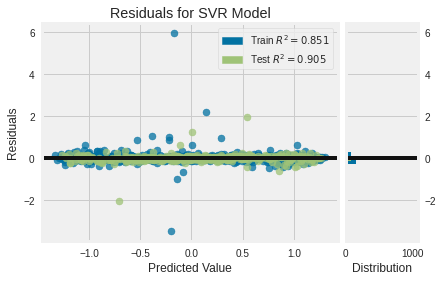

In [41]:
plot_model(tuned_svr_yaw)

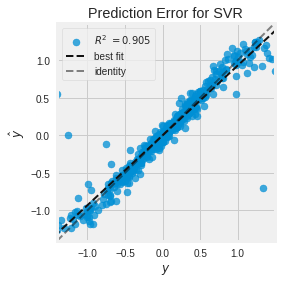

In [42]:
plot_model(tuned_svr_yaw, plot = 'error')

In [43]:
evaluate_model(tuned_svr_yaw)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [44]:
predict_model(tuned_svr_yaw);

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Support Vector Regression,0.0711,0.0265,0.1628,0.9051,0.0725,0.7519


In [45]:
final_svr_yaw = finalize_model(tuned_svr_yaw)

In [46]:
print(final_svr_yaw)


SVR()


In [47]:
predict_model(final_svr_yaw);

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Support Vector Regression,0.0656,0.0198,0.1405,0.9293,0.0729,0.6733


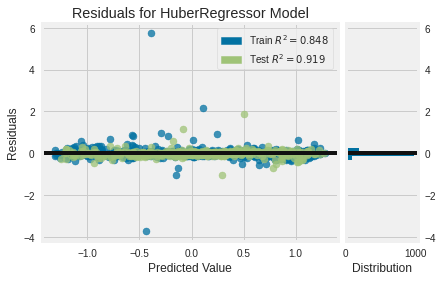

In [48]:
plot_model(tuned_huber_yaw)

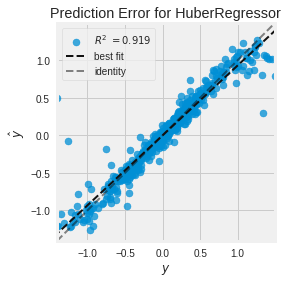

In [49]:
plot_model(tuned_huber_yaw, plot = 'error')

In [50]:
evaluate_model(tuned_huber_yaw)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [51]:
predict_model(tuned_huber_yaw);

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Huber Regressor,0.0775,0.0226,0.1502,0.9193,0.0797,0.8169


In [52]:
final_huber_yaw = finalize_model(tuned_huber_yaw)

In [53]:
predict_model(final_huber_yaw);

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Huber Regressor,0.0732,0.0210,0.1448,0.9249,0.0753,0.6958


In [54]:
blender_yaw = blend_models(estimator_list = [final_huber_yaw, final_svr_yaw])

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0718,0.0147,0.1211,0.9598,0.0646,0.4467
1,0.0665,0.0102,0.1011,0.9612,0.0678,0.5839
2,0.0810,0.0460,0.2144,0.8867,0.1023,0.6586
3,0.0731,0.0168,0.1297,0.9506,0.0714,0.3556
4,0.0669,0.0148,0.1215,0.9575,0.0579,0.6075
5,0.0759,0.0268,0.1638,0.9097,0.0917,0.4069
6,0.0843,0.0236,0.1536,0.9210,0.0913,0.4879
7,0.0963,0.1123,0.3351,0.7156,0.1171,1.1095
8,0.0698,0.0143,0.1195,0.9479,0.0741,0.5010


Processing:   0%|          | 0/6 [00:00<?, ?it/s]

#### roll models

In [55]:
clfroll = setup(
    data=XYroll, 
    target='roll',
    #test_data = test,
    #data_split_shuffle = False,
    n_jobs = -1,
    #remove_perfect_collinearity= False,
    #transformation = True,
    use_gpu = True , #True,force
    session_id=42, #123 # 7 
)


,Description,Value
0,Session id,42
1,Target,roll
2,Target type,Regression
3,Data shape,"(1853, 937)"
4,Train data shape,"(1297, 937)"
5,Test data shape,"(556, 937)"
6,Numeric features,936
7,Preprocess,True
8,Imputation type,simple
9,Numeric imputation,mean


In [56]:
from sklearn.svm import SVR
svr = SVR() 
# compare models 
best = compare_models(include = ['huber' ,svr] , sort='MAE', n_select = 2 )

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
1,Support Vector Regression,0.0868,0.4071,0.3977,0.6549,0.1037,1.4361,0.1960
0,Huber Regressor,0.0932,0.4275,0.4172,0.6100,0.1142,1.6140,2.6170


Processing:   0%|          | 0/14 [00:00<?, ?it/s]

In [57]:
print(best[0])

SVR()


In [58]:
svr_roll = create_model(svr)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0874,0.0873,0.2954,0.5372,0.1294,0.8215
1,0.0426,0.0049,0.0702,0.9215,0.0458,1.5790
2,0.0650,0.0191,0.1381,0.8373,0.0776,0.6868
3,0.0509,0.0054,0.0735,0.9459,0.0520,2.7223
4,0.0558,0.0110,0.1048,0.8587,0.0709,0.8137
5,0.0810,0.0658,0.2565,0.5426,0.1054,0.7240
6,0.0631,0.0235,0.1532,0.7397,0.0831,1.5185
7,0.1770,1.8992,1.3781,0.1430,0.2003,1.7156
8,0.0631,0.0130,0.1141,0.8632,0.0779,2.6653


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [59]:
tuned_svr_roll = tune_model(svr_roll)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.2188,0.1654,0.4067,0.1228,0.2042,2.1443
1,0.2247,0.0719,0.2681,-0.1464,0.1765,7.2453
2,0.3059,0.1541,0.3926,-0.3150,0.2326,7.6178
3,0.2602,0.1099,0.3315,-0.1000,0.2005,9.8559
4,0.2344,0.1046,0.3235,-0.3468,0.1784,4.3690
5,0.2573,0.2623,0.5122,-0.8231,0.1894,6.7916
6,0.1875,0.0907,0.3011,-0.0053,0.1718,7.7642
7,0.3441,1.6335,1.2781,0.2629,0.2382,9.5238
8,0.2754,0.1267,0.3559,-0.3324,0.1967,13.8305


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


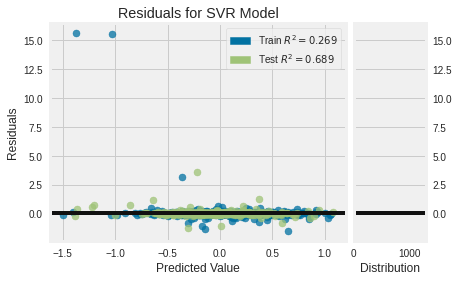

In [60]:
plot_model(tuned_svr_roll)

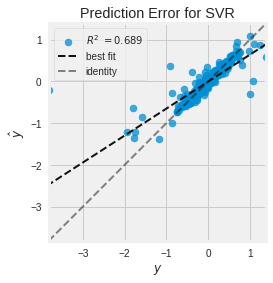

In [61]:
plot_model(tuned_svr_roll, plot = 'error')

In [62]:
evaluate_model(tuned_svr_roll)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [63]:
predict_model(tuned_svr_roll);

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Support Vector Regression,0.0703,0.0444,0.2108,0.6887,0.0957,1.8000


In [64]:
final_svr_roll = finalize_model(tuned_svr_roll)

In [65]:
print(final_svr_roll)


SVR()


In [66]:
predict_model(final_svr_roll);

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Support Vector Regression,0.0643,0.0401,0.2003,0.7188,0.0925,1.7984


In [67]:
blender_roll= blend_models(estimator_list = [final_svr_roll])

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0874,0.0873,0.2954,0.5372,0.1294,0.8215
1,0.0426,0.0049,0.0702,0.9215,0.0458,1.5790
2,0.0650,0.0191,0.1381,0.8373,0.0776,0.6868
3,0.0509,0.0054,0.0735,0.9459,0.0520,2.7223
4,0.0558,0.0110,0.1048,0.8587,0.0709,0.8137
5,0.0810,0.0658,0.2565,0.5426,0.1054,0.7240
6,0.0631,0.0235,0.1532,0.7397,0.0831,1.5185
7,0.1770,1.8992,1.3781,0.1430,0.2003,1.7156
8,0.0631,0.0130,0.1141,0.8632,0.0779,2.6653


Processing:   0%|          | 0/6 [00:00<?, ?it/s]

### Testing the model on the image

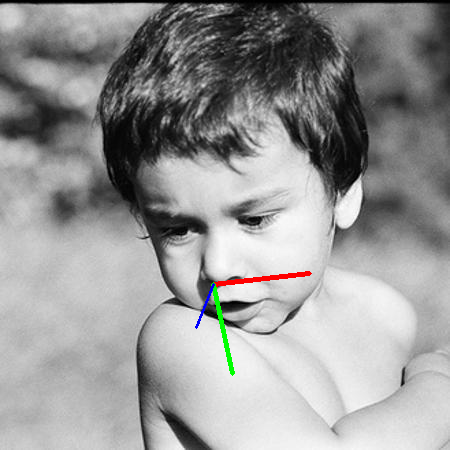

In [68]:
# choosing random image from the testing data
faceModule = mediapipe.solutions.face_mesh
with faceModule.FaceMesh(static_image_mode=True) as face:
  # reading the image
  frame = cv2.imread('/content/AFLW2000/image00075.jpg')
  # processing the image to detect the face and then generating the land marks (468 for each x,y,z).
  results = face.process(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
  if results.multi_face_landmarks != None:
    for face in results.multi_face_landmarks:
        # initializing two lists to store x and y points
        X = []
        Y = []
        for j,landmark in enumerate(face.landmark):
            x = landmark.x
            y = landmark.y
            # getting the points back to its actual values
            shape = frame.shape 
            relative_x = int(x * shape[1])
            relative_y = int(y * shape[0])
            # appending the points to the X and Y lists
            X.append(relative_x)
            Y.append(relative_y)

        # converting the x and y points to numpy array
        X = np.array(X)
        Y = np.array(Y)

        # centering the points of x and y values arround the point no. 114
        X_center = X - X[114]
        Y_center = Y - Y[114]
        # computing the distance between the point 171 and 10
        d = np.linalg.norm(np.array((X[171],Y[171])) - np.array((X[10],Y[10])))
        # normalizing the points
        X_norm = X_center/d
        Y_norm = Y_center/d
        X_norm = X_norm
        Y_norm = Y_norm
        # concatinating the x and y points to predict the labels (pitch,yaw,roll)
        points = np.hstack([X_norm,Y_norm]).reshape(1,-1)
        # predicting the 3 angels to draw the axis on the image
        pred_pitch = blender_pitch.predict(points)
        pred_yaw = blender_yaw.predict(points)
        pred_roll = blender_roll.predict(points)
        cv2_imshow(draw_axis(frame,pred_pitch,pred_yaw,pred_roll,X[99],Y[99]))

### Connect to my github and my G-drive

In [70]:
pred_roll


array([-0.19683051])

In [79]:
!rm -r /content/sample_data

In [84]:
# get video to test on
%%capture
!cd /content
!git clone https://github.com/ahmed98Osama/Head_Pose_Estimation.git

In [85]:
!cd /content/Head_Pose_Estimation/

In [86]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [171]:
! ls /content/drive/MyDrive/Data/head_pose_videos/Test_videos/input

50vid.mp4  balibalk.mp4  boskash.mp4  Tab3nTab3nOmal.mp4  testing.mp4


In [172]:
#Examples
#https://drive.google.com/drive/folders/1-OxlDhqQSYK1x3DutI27WlUmWQqnjnjz
! ls /content/drive/MyDrive/Data/head_pose_videos/Test_videos/output

50vid_output.gif     boskash_output.gif		testing_output.gif
50vid_output.mp4     boskash_output.mp4		testing_output.mp4
balibalk_output.gif  Tab3nTab3nOmal_output.gif
balibalk_output.mp4  Tab3nTab3nOmal_output.mp4


### Testing the model on a video by processing its frames and drawing the axis on them

In [169]:
# Create a VideoCapture object and read from input file
input = "/content/drive/MyDrive/Data/head_pose_videos/Test_videos/input/"
output = "/content/drive/MyDrive/Data/head_pose_videos/Test_videos/output/"
video_name = "testing"
def Create_TestVideo(pitch_model,yaw_model,roll_model,size = 30):
  cap = cv2.VideoCapture(input+ video_name +'.mp4')
  width= int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
  height= int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

  # Check if video opened successfully
  if (cap.isOpened()== False): 
      print("Error opening video file")


  # initializing a list to store the frames   
  img_array = []
  # Read until video is completed
  while(cap.isOpened()):   
    # Capture frame-by-frame
      ret, frame = cap.read()
      if ret == True:
        with faceModule.FaceMesh(static_image_mode=True) as face:
          # processing the image to detect the face and then generating the land marks (468 for each x,y,z).
          results = face.process(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
          if results.multi_face_landmarks != None:
            for face in results.multi_face_landmarks:
                # initializing X and Y lists to store the spacial coordinates of the points
                X = []
                Y = []
                # looping over the landmarks to extract x and y
                for j,landmark in enumerate(face.landmark):
                    x = landmark.x
                    y = landmark.y
                    # retrieve the true values of x and y
                    shape = frame.shape 
                    relative_x = int(x * shape[1])
                    relative_y = int(y * shape[0])
                    X.append(relative_x)
                    Y.append(relative_y)

                X = np.array(X)
                Y = np.array(Y)
                # centering the data arround the point 99
                X_center = X - X[99]
                Y_center = Y - Y[99]
                d = np.linalg.norm(np.array((X[171],Y[171])) - np.array((X[10],Y[10])))
                X_norm = X_center/d
                Y_norm = Y_center/d
                X_norm = X_norm
                Y_norm = Y_norm
                points = np.hstack([X_norm,Y_norm]).reshape(1,-1)
                # predicting the 3 angels to draw the axis on the image
                pred_pitch = pitch_model.predict(points)
                pred_yaw = yaw_model.predict(points)
                pred_roll = roll_model.predict(points)
                
                draw_axis(frame,pred_pitch,pred_yaw,pred_roll,X[1],Y[1] , size = size )
                # appending the result frame to the img_array list
                img_array.append(frame)
      # Break the loop
      else: 
          break
  cap.release()  
  # Closes all the frames
  cv2.destroyAllWindows()
  print("Number of frames found in the video = ",len(img_array))
  # converting the frames to video
  out = cv2.VideoWriter(output+ video_name +'_output.mp4',cv2.VideoWriter_fourcc(*'DIVX'), 30, (width,height))
  for i in range(len(img_array)):
    out.write(img_array[i])
  out.release()

In [170]:
Create_TestVideo(blender_pitch,blender_yaw,blender_roll, size = 50)

Number of frames found in the video =  988


### To Get videos in Drive 

In [ ]:
# # to download Video
# import os
# os.chdir("/content/drive/MyDrive/Data/head_pose_videos/Test_videos/input")
# !wget -c "video_download_link" --no-check-certificate


In [ ]:
# !cp /content/drive/Shareddrives/BadbotDRIVE/Videos_Folder /content/drive/MyDrive/Data/head_pose_videos/Test_videos/ -r